# Installing LIME

In [66]:
!pip install lime

Defaulting to user installation because normal site-packages is not writeable

[notice] A new release of pip is available: 24.3.1 -> 26.0.1
[notice] To update, run: /Applications/Xcode.app/Contents/Developer/usr/bin/python3 -m pip install --upgrade pip


# Importing necessary libraries

In [67]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import StratifiedShuffleSplit
from sklearn import metrics
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.metrics import r2_score
from lime import lime_tabular
from lime.lime_tabular import LimeTabularExplainer

#Data import

In [68]:
Aircraft_df = pd.read_excel("FullAircraftEngineData.xlsx")

In [69]:
Aircraft_df.head()

,unit number,"time, in cycles",operational setting 1,operational setting 2,operational setting 3,sensor measurement 1,sensor measurement 2,sensor measurement 3,sensor measurement 4,sensor measurement 5,...,sensor measurement 12,sensor measurement 13,sensor measurement 14,sensor measurement 15,sensor measurement 16,sensor measurement 17,sensor measurement 18,sensor measurement 19,sensor measurement 20,sensor measurement 21
0,1,1,10.0047,0.2501,20,489.05,604.13,1499.45,1309.95,10.52,...,372.15,2388.13,8120.83,8.6216,0.03,368,2319,100.0,28.58,17.1735
1,1,2,0.0015,0.0003,100,518.67,642.13,1584.55,1403.96,14.62,...,521.81,2388.15,8132.87,8.3907,0.03,391,2388,100.0,38.99,23.3619
2,1,3,34.9986,0.8401,60,449.44,555.42,1368.17,1122.49,5.48,...,183.26,2387.95,8063.84,9.3557,0.02,334,2223,100.0,14.83,8.8555
3,1,4,20.0031,0.7005,0,491.19,607.03,1488.44,1249.18,9.35,...,314.84,2388.07,8052.30,9.2231,0.02,364,2324,100.0,24.42,14.7832
4,1,5,42.0041,0.8405,40,445.00,549.52,1354.48,1124.32,3.91,...,130.44,2387.89,8083.67,9.2986,0.02,330,2212,100.0,10.99,6.4025


In [70]:
#rename the column head 'time, in cycles' to just time
Aircraft_df = Aircraft_df.rename(columns={'time, in cycles': 'time'})

In [71]:
Aircraft_df.head()

,unit number,time,operational setting 1,operational setting 2,operational setting 3,sensor measurement 1,sensor measurement 2,sensor measurement 3,sensor measurement 4,sensor measurement 5,...,sensor measurement 12,sensor measurement 13,sensor measurement 14,sensor measurement 15,sensor measurement 16,sensor measurement 17,sensor measurement 18,sensor measurement 19,sensor measurement 20,sensor measurement 21
0,1,1,10.0047,0.2501,20,489.05,604.13,1499.45,1309.95,10.52,...,372.15,2388.13,8120.83,8.6216,0.03,368,2319,100.0,28.58,17.1735
1,1,2,0.0015,0.0003,100,518.67,642.13,1584.55,1403.96,14.62,...,521.81,2388.15,8132.87,8.3907,0.03,391,2388,100.0,38.99,23.3619
2,1,3,34.9986,0.8401,60,449.44,555.42,1368.17,1122.49,5.48,...,183.26,2387.95,8063.84,9.3557,0.02,334,2223,100.0,14.83,8.8555
3,1,4,20.0031,0.7005,0,491.19,607.03,1488.44,1249.18,9.35,...,314.84,2388.07,8052.30,9.2231,0.02,364,2324,100.0,24.42,14.7832
4,1,5,42.0041,0.8405,40,445.00,549.52,1354.48,1124.32,3.91,...,130.44,2387.89,8083.67,9.2986,0.02,330,2212,100.0,10.99,6.4025


# Data preprocessing

## Calculating the RUL

In [72]:
Engine_no = list(Aircraft_df['unit number'].unique())  #This stores the total number of engine

In [73]:
# Iterate over each engine number
for engine_number in Engine_no:
    # Filter rows for the current engine number
    Aircraft_engine = Aircraft_df[Aircraft_df['unit number'] == engine_number]

    # Calculate the last 'time' value for the current engine
    last_time_value = Aircraft_engine['time'].iloc[-1]

    # Calculate RUL for the current engine
    Aircraft_df.loc[Aircraft_df['unit number'] == engine_number, 'RUL'] = last_time_value - Aircraft_engine['time']
    Aircraft_cleaned = Aircraft_df.copy()


In [74]:
Aircraft_cleaned.head()

,unit number,time,operational setting 1,operational setting 2,operational setting 3,sensor measurement 1,sensor measurement 2,sensor measurement 3,sensor measurement 4,sensor measurement 5,...,sensor measurement 13,sensor measurement 14,sensor measurement 15,sensor measurement 16,sensor measurement 17,sensor measurement 18,sensor measurement 19,sensor measurement 20,sensor measurement 21,RUL
0,1,1,10.0047,0.2501,20,489.05,604.13,1499.45,1309.95,10.52,...,2388.13,8120.83,8.6216,0.03,368,2319,100.0,28.58,17.1735,222.0
1,1,2,0.0015,0.0003,100,518.67,642.13,1584.55,1403.96,14.62,...,2388.15,8132.87,8.3907,0.03,391,2388,100.0,38.99,23.3619,221.0
2,1,3,34.9986,0.8401,60,449.44,555.42,1368.17,1122.49,5.48,...,2387.95,8063.84,9.3557,0.02,334,2223,100.0,14.83,8.8555,220.0
3,1,4,20.0031,0.7005,0,491.19,607.03,1488.44,1249.18,9.35,...,2388.07,8052.30,9.2231,0.02,364,2324,100.0,24.42,14.7832,219.0
4,1,5,42.0041,0.8405,40,445.00,549.52,1354.48,1124.32,3.91,...,2387.89,8083.67,9.2986,0.02,330,2212,100.0,10.99,6.4025,218.0


In [75]:
Aircraft_cleaned[['unit number','time','operational setting 1','operational setting 3','sensor measurement 1','sensor measurement 21','RUL']].loc[Aircraft_df['unit number']==218]

,unit number,time,operational setting 1,operational setting 3,sensor measurement 1,sensor measurement 21,RUL
45785,218,1,0.0027,100,518.67,23.3613,132.0
45786,218,2,0.0010,100,518.67,23.3885,131.0
45787,218,3,0.0025,100,518.67,23.3561,130.0
45788,218,4,41.9984,40,445.00,6.3894,129.0
45789,218,5,0.0030,100,518.67,23.3377,128.0
...,...,...,...,...,...,...,...
45913,218,129,42.0066,40,445.00,6.2985,4.0
45914,218,130,42.0029,40,445.00,6.2741,3.0
45915,218,131,41.9999,40,445.00,6.1978,2.0
45916,218,132,35.0007,60,449.44,8.6761,1.0


##This part of the code is to export the complete dataset with the calculated "RUL" *NB: Its not necessary for the analysis*

In [76]:
# import os

# # Define the file path for the Excel file
# excel_file_path = '/content/drive/MyDrive/PROJECT - XAI/full data.xlsx'



# # Export the DataFrame to an Excel file in the same directory
# output_file_name = 'Aircraft_df_to_excel.xlsx'
# output_file_path = os.path.join(os.path.dirname(excel_file_path), output_file_name)
# Aircraft_cleaned.to_excel(output_file_path, index=False)

# # Print a message to confirm the export
# print(f"DataFrame exported to {output_file_path}")

## Data cleaning

In [77]:
#removing the column 'unit number' because its not a valuable feature
Aircraft_cleaned.drop(columns=['unit number'], inplace=True)

In [78]:
Aircraft_label = Aircraft_cleaned['RUL'].copy()   #adding the churn column to a label variable
Aircraft_feature = Aircraft_cleaned.drop('RUL', axis = 1) #other columns as stored as feautres



# Splitting the dataset into training and test sets
X_train, X_test, y_train, y_test = train_test_split(Aircraft_feature, Aircraft_label, test_size=0.2, random_state=42)

# Model Training & Evaluation

## Training Gradient Boosting Regressor

In [79]:


# Define the Gradient Boosting Regressor
gb_regressor = GradientBoostingRegressor()

# Train the regressor
gb_regressor.fit(X_train, y_train)

# Predict on the test set
y_pred = gb_regressor.predict(X_test)

# Calculate mean squared error
mse = mean_squared_error(y_test, y_pred)
print("Mean Squared Error:", mse)

# Calculate R-squared
r_squared = r2_score(y_test, y_pred)
print("R-squared:", r_squared)


Mean Squared Error: 1248.5247554117475
R-squared: 0.7331471442860311


## Visualization of the predicted value against the actual value for model validation

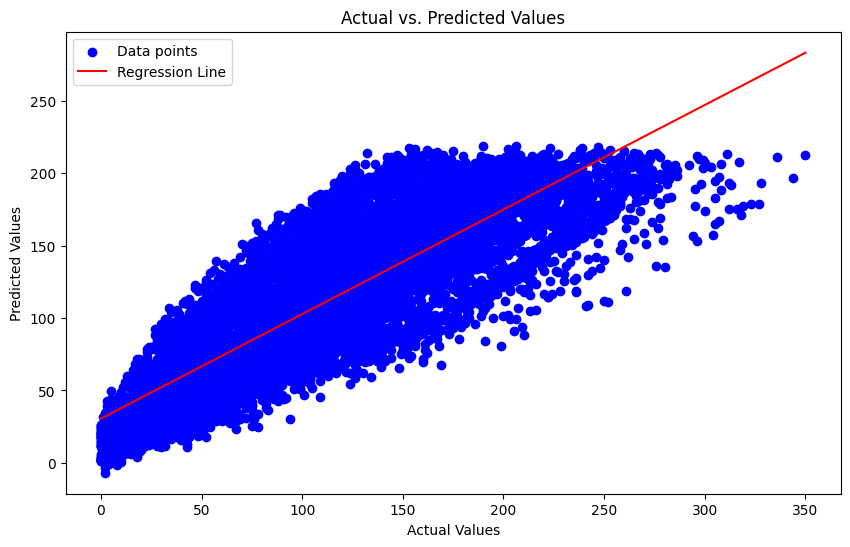

In [80]:
# Plotting the actual vs predicted values
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred, color='blue', label='Data points')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.title('Actual vs. Predicted Values')

identity_line = np.linspace(min(y_test), max(y_test), 100)

# Calculating the regression line
slope, intercept = np.polyfit(y_test, y_pred, 1)
regression_line = slope * identity_line + intercept
plt.plot(identity_line, regression_line, color='red', label='Regression Line')

plt.legend()
plt.show()

# Applying LIME

## Generating a single explanation

In [81]:
from lime.lime_tabular import LimeTabularExplainer

# Define the LimeTabularExplainer
explainer = LimeTabularExplainer(X_train.values,
                                  feature_names=X_train.columns.tolist(),
                                  mode='regression',
                                  discretize_continuous=False)

# Select an instance to explain (data_row)
data_row = X_test.iloc[10]

# Generate explanations using the Gradient Boosting Regressor (gb_regressor)
explanation = explainer.explain_instance(data_row, gb_regressor.predict, num_features=8)

# Show the explanation
explanation.show_in_notebook()

/Users/sohamjain/Library/Python/3.9/lib/python/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but GradientBoostingRegressor was fitted with feature names
  warnings.warn(


## Proof of LIME's instability by generating 5 explanations

In [82]:

# Define the number of samples and iterations for S-LIME
num_samples = 100
num_iterations = 5

# Initialize an array to store explanations
explanations = []

# Perform multiple sampling and generate explanations
for i in range(num_iterations):
    # Sample the dataset
    sampled_indices = np.random.choice(len(X_train), size=num_samples, replace=True)
    sampled_X_train = X_train.iloc[sampled_indices]

    # Initialize LIME explainer
    explainer = LimeTabularExplainer(sampled_X_train.values,
                                      mode='regression',
                                      feature_names=sampled_X_train.columns.tolist(),
                                      discretize_continuous=False)

    # Select an instance to explain (data_row)
    data_row = X_test.iloc[10]

    # Generate explanation using LIME
    explanation = explainer.explain_instance(data_row.values, gb_regressor.predict, num_features=8)
    explanations.append(explanation)

for ex in explanations:
  ex.show_in_notebook()

/Users/sohamjain/Library/Python/3.9/lib/python/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but GradientBoostingRegressor was fitted with feature names
  warnings.warn(
/Users/sohamjain/Library/Python/3.9/lib/python/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but GradientBoostingRegressor was fitted with feature names
  warnings.warn(
/Users/sohamjain/Library/Python/3.9/lib/python/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but GradientBoostingRegressor was fitted with feature names
  warnings.warn(
/Users/sohamjain/Library/Python/3.9/lib/python/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but GradientBoostingRegressor was fitted with feature names
  warnings.warn(
/Users/sohamjain/Library/Python/3.9/lib/python/site-packages/sklearn/utils/validation.py:2739: UserWarning: X do

# Applying S-LIME to solve instability using weight aggregration

## Weight Aggregation

In [83]:
# Determine the number of features in the dataset
num_features = len(X_train.columns)

# Initialize an array to store the aggregated feature weights
aggregated_weights = np.zeros(num_features)

# Aggregate explanations to create a consensus explanation
for explanation in explanations:
    local_exp = explanation.local_exp[1]  # Get local explanation for the predicted class
    #print(local_exp)
    for feature_idx, weights in local_exp:
        aggregated_weights[feature_idx] += np.abs(weights) / len(explanations)

#Print or visualize the aggregated explanation
print("Aggregated Explanation:")
for feature_idx, weight in enumerate(aggregated_weights):
    print(f"Feature {X_train.columns[feature_idx]}: {weight}")

Aggregated Explanation:
Feature time: 42.6826236482544
Feature operational setting 1: 0.0
Feature operational setting 2: 0.0
Feature operational setting 3: 0.0
Feature sensor measurement 1: 0.0
Feature sensor measurement 2: 0.6383318328139695
Feature sensor measurement 3: 2.399669747243887
Feature sensor measurement 4: 7.478272938668463
Feature sensor measurement 5: 0.0
Feature sensor measurement 6: 0.0
Feature sensor measurement 7: 0.8783293818126454
Feature sensor measurement 8: 0.20027276629396845
Feature sensor measurement 9: 0.5202096655489566
Feature sensor measurement 10: 0.0
Feature sensor measurement 11: 12.055392213164296
Feature sensor measurement 12: 0.0
Feature sensor measurement 13: 5.0288625401388405
Feature sensor measurement 14: 0.16336178885137134
Feature sensor measurement 15: 16.14775886990571
Feature sensor measurement 16: 0.0
Feature sensor measurement 17: 0.49214380663990975
Feature sensor measurement 18: 0.0
Feature sensor measurement 19: 0.0
Feature sensor meas

## Visualization 2 iterations of aggregated explanation to prove stability

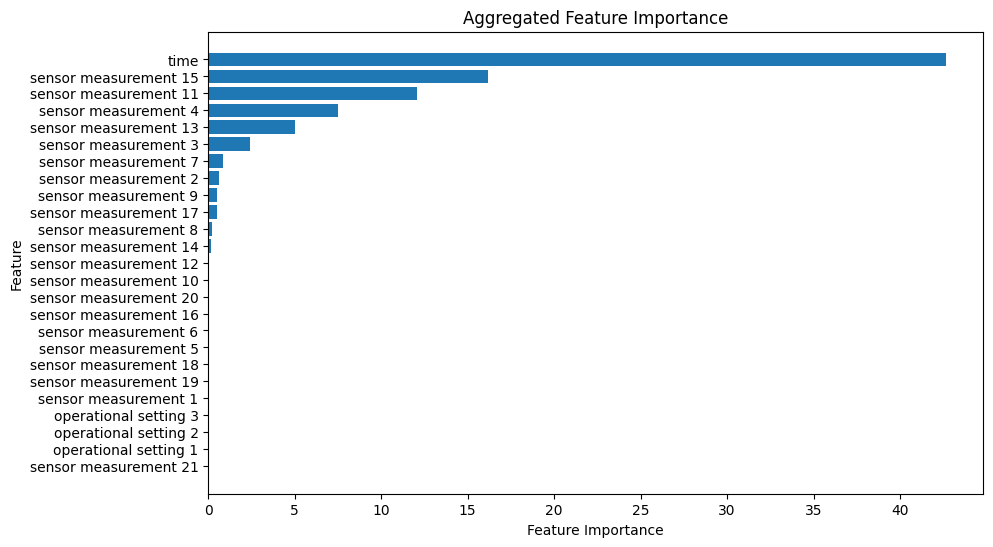

In [84]:
import matplotlib.pyplot as plt

# Sort features based on their aggregated weights
sorted_indices = np.argsort(aggregated_weights)[::-1]  # Sort in descending order
sorted_features = np.array(X_train.columns)[sorted_indices]
sorted_weights = aggregated_weights[sorted_indices]

# Plot the aggregated weights
plt.figure(figsize=(10, 6))
plt.barh(range(len(sorted_features)), sorted_weights, align='center')
plt.yticks(range(len(sorted_features)), sorted_features)
plt.xlabel('Feature Importance')
plt.ylabel('Feature')
plt.title('Aggregated Feature Importance')
plt.gca().invert_yaxis()  # Invert y-axis to show the most important features at the top
plt.show()

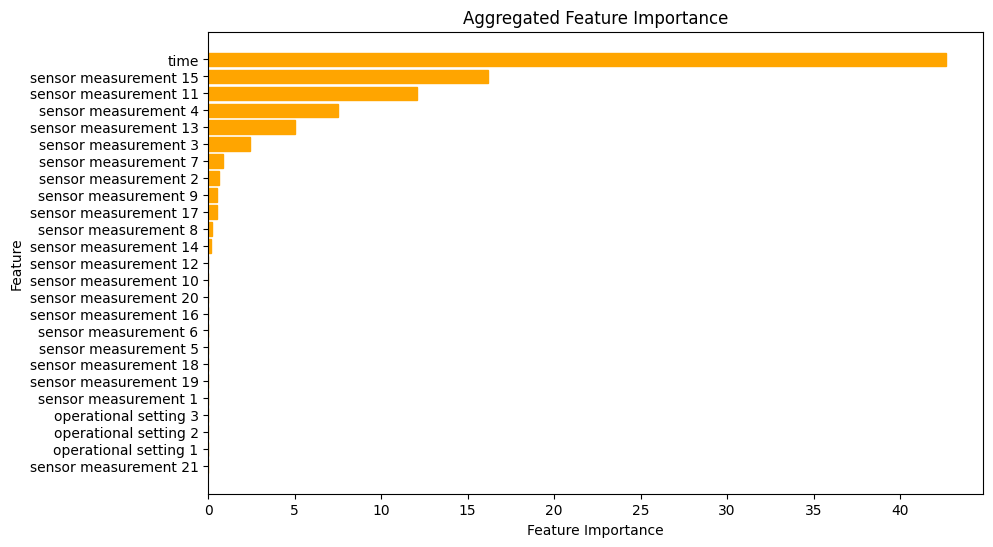

In [85]:
# Sort features based on their aggregated weights
sorted_indices = np.argsort(aggregated_weights)[::-1]  # Sort in descending order
sorted_features = np.array(X_train.columns)[sorted_indices]
sorted_weights = aggregated_weights[sorted_indices]

# Plot the aggregated weights
plt.figure(figsize=(10, 6))
bars = plt.barh(range(len(sorted_features)), sorted_weights, align='center', color='lightgreen')
plt.yticks(range(len(sorted_features)), sorted_features)
plt.xlabel('Feature Importance')
plt.ylabel('Feature')
plt.title('Aggregated Feature Importance')
plt.gca().invert_yaxis()  # Invert y-axis to show the most important features at the top

# Customizing the color of the bars
for bar in bars:
    bar.set_color('orange')

plt.show()


# Measuring stability: Jaccard index and Spearman correlation

Two explanations of the same instance are compared on:

- **Jaccard index** - how many of the top-8 features they share.
- **Spearman correlation** - whether they put the shared features in the same order,
  computed on the features both runs selected.

Both are averaged over every pair of runs. 1.0 means perfect agreement.

In [ ]:
from scipy.stats import spearmanr

k = 8   # number of features each explanation shows

def top_k_features(explanation, k=8):
    """Feature indices of one explanation, strongest first."""
    weights = sorted(explanation.local_exp[1], key=lambda t: -abs(t[1]))
    return [idx for idx, w in weights[:k]]

def jaccard(a, b):
    """Shared features / combined features."""
    return len(set(a) & set(b)) / len(set(a) | set(b))

def spearman_on_common(a, b):
    """Rank correlation on the features both runs selected."""
    common = list(set(a) & set(b))
    if len(common) < 2:
        return np.nan
    rank_a = [a.index(f) for f in common]
    rank_b = [b.index(f) for f in common]
    return spearmanr(rank_a, rank_b)[0]

def pairwise_scores(sets):
    """Compare every pair of runs."""
    j, s = [], []
    for i in range(len(sets)):
        for m in range(i + 1, len(sets)):
            j.append(jaccard(sets[i], sets[m]))
            s.append(spearman_on_common(sets[i], sets[m]))
    return j, s

# The 5 explanations generated above
lime_sets = [top_k_features(ex, k) for ex in explanations]
lime_j, lime_s = pairwise_scores(lime_sets)

print("LIME")
print("  pairs compared     :", len(lime_j))
print("  mean Jaccard index : %.3f" % np.mean(lime_j))
print("  mean Spearman      : %.3f" % np.nanmean(lime_s))

## WA-LIME stability

The same two measures applied to WA-LIME. Each WA-LIME run is the weight
aggregation above, repeated so that runs can be compared with each other.

In [ ]:
# One WA-LIME run = the 5 explanations above, aggregated.
# Stability is measured between runs, so we need more than one run.
def wa_lime_run():
    aggregated = np.zeros(len(X_train.columns))
    for i in range(num_iterations):
        sampled_indices = np.random.choice(len(X_train), size=num_samples, replace=True)
        sampled_X_train = X_train.iloc[sampled_indices]
        explainer = LimeTabularExplainer(sampled_X_train.values,
                                         mode='regression',
                                         feature_names=sampled_X_train.columns.tolist(),
                                         discretize_continuous=False)
        explanation = explainer.explain_instance(data_row.values,
                                                 gb_regressor.predict,
                                                 num_features=8)
        for feature_idx, weight in explanation.local_exp[1]:
            aggregated[feature_idx] += np.abs(weight) / num_iterations
    return list(np.argsort(-aggregated)[:k])

wa_sets = [wa_lime_run() for run in range(3)]
wa_j, wa_s = pairwise_scores(wa_sets)

print("WA-LIME")
print("  pairs compared     :", len(wa_j))
print("  mean Jaccard index : %.3f" % np.mean(wa_j))
print("  mean Spearman      : %.3f" % np.nanmean(wa_s))

print()
print("                Jaccard   Spearman")
print("LIME             %.3f     %.3f" % (np.mean(lime_j), np.nanmean(lime_s)))
print("WA-LIME          %.3f     %.3f" % (np.mean(wa_j), np.nanmean(wa_s)))